# Is San Francisco Coming Back?  
### A Data-Driven Look at the City’s Recovery (2018–2024)

## Framing the Question
The pandemic dramatically reshaped how San Francisco works, commutes, and socializes. While anecdotes abound about empty offices and struggling downtowns, I wanted to take a **data-first approach** to ask: *Has San Francisco actually recovered?*  

To answer this, I pulled together three complementary signals of urban mobility:  
- **Parking meter revenue** (2018 baseline, compared with 2020 and 2024)  
- **Muni ridership** (route-level average boardings)  
- **BART station exits** (daily counts, 2014–2024, aggregated monthly)  

Each captures a different facet of city activity: cars, surface transit, and regional rail.

---

## Parking Revenue: Uneven Recovery
Citywide parking revenue fell by more than **50% between 2018 and 2020**, reflecting the sharp drop in downtown activity. By 2024, revenues had improved but remained **~25% below pre-pandemic levels**.  

- **South of Market**, **Financial District**, and **Union Square** still lag significantly behind 2018.  
- Residential and mixed-use neighborhoods like **Mission Bay** and **Union Street** show stronger rebounds.  
- A recovery index by neighborhood highlights that **outer and waterfront areas** recovered faster than the commercial downtown core.  

Parking reflects where people spend time on errands, dining, or leisure. The weak rebound in downtown suggests slower recovery in office-dependent and tourist-heavy zones.

---

## Muni Ridership: Core Lines Still Struggling
Muni tells a similar story.  
- In 2018, the **N Judah** and **14 Mission** were the heaviest-ridership lines.  
- By 2020, ridership collapsed systemwide.  
- By 2024, many routes show partial recovery, but most remain below 2018 levels.  

Interestingly, the **map of 2024/2018 ratios** shows *more blue lines concentrated downtown*, indicating some **routes serving central neighborhoods have grown relative to baseline**, even as overall totals are still depressed.

While systemwide totals remain low, localized recovery may reflect more **intra-city travel** (residents moving within SF) versus **commute-oriented travel** from outside.

---

## BART Exits: The Downtown Cliff
BART data is the clearest indicator of disruption.  

- From 2014 to early 2020, San Francisco stations (Embarcadero, Montgomery, Powell, Civic Center) consistently logged **~4M monthly exits combined**.  
- In March 2020, ridership fell off a cliff, dropping more than **80% overnight**.  
- By 2024, ridership at these downtown stations has recovered **only to 50–60% of 2018 levels**.  

BART’s downtown stations are the lifeblood of SF’s office commute. Their slow recovery strongly suggests the impact of **remote work, office closures, and fewer inbound commuters**.

---

## Putting It Together
Each dataset paints part of the same picture:  
- **Parking revenue**: residential/mixed-use neighborhoods bounce back; downtown still lagging.  
- **Muni ridership**: recovery uneven; some central lines stronger, but systemwide totals remain below baseline.  
- **BART exits**: stark and persistent decline in downtown work-related commuting.  

The overall story: **San Francisco is back in parts, but downtown is not.**  
Leisure, residential, and neighborhood-based activity have rebounded, but the Financial District and Union Square have not regained their pre-pandemic vitality.

---

## Limitations & Next Steps
This case study gives a powerful glimpse, but it’s **not the whole picture**:  
- Parking revenue can be influenced by policy changes (pricing, enforcement).  
- Transit ridership reflects behavior, but not foot traffic for retail or tourism.  
- BART data shows commuter flows, but not who is replacing them (tourists, residents, hybrid workers).  

For a fuller view of SF’s recovery, we’d need additional (often paid) data sources:  
- **Office occupancy / badge swipe data** (e.g., Kastle Systems) to measure return-to-office.  
- **Cell-phone mobility or foot traffic data** (SafeGraph, Placer.ai) to track retail and event activity.  
- **Commercial real estate and leasing data** to assess office vacancies and economic shifts.  
- **Event calendars and tourism metrics** (hotel occupancy, airport arrivals) to understand downtown vibrancy.  

---

## Takeaway
San Francisco’s recovery is **partial, uneven, and still in motion**.  
The city outside downtown is alive again, but the core that once revolved around office towers and commuting has yet to fully rebound.  


# 2018 Revenue Heatmap

In [12]:
import pandas as pd
import numpy as np
import folium
from folium.plugins import HeatMap

# Aggregate revenue per meter
revenue_2018 = (
    df_2018_combined
    .groupby("post_id")["gross_paid_amt"]
    .sum()
    .reset_index()
    .rename(columns={"gross_paid_amt": "total_revenue"})
)

# Merge with meter coordinates
meters_subset = meters_df[["POST_ID", "LATITUDE", "LONGITUDE"]]
merged = revenue_2018.merge(
    meters_subset,
    left_on="post_id",
    right_on="POST_ID",
    how="left"
)

# Filter out rows with missing or zero/negative revenue or location
merged = merged.dropna(subset=["LATITUDE", "LONGITUDE", "total_revenue"])
merged = merged[merged["total_revenue"] > 0]

# Apply log1p
merged["log_revenue"] = np.log1p(merged["total_revenue"])

# Prepare heatmap points
heat_points = merged[["LATITUDE", "LONGITUDE", "log_revenue"]].values.tolist()

# Build heatmap
sf_center = [37.7749, -122.4194]
m = folium.Map(location=sf_center, zoom_start=13, tiles="CartoDB positron")

HeatMap(
    heat_points,
    radius=15,
    blur=10,
    max_zoom=1
).add_to(m)

# Show map
m


# 2020 Relative (to 2018) Revenue Heatmap

In [14]:
import pandas as pd
import numpy as np
import folium
from folium.plugins import HeatMap

# Aggregate revenue per meter
rev_2018 = df_2018_combined.groupby("post_id")["gross_paid_amt"].sum().reset_index()
rev_2020 = df_2020_combined.groupby("post_id")["gross_paid_amt"].sum().reset_index()

rev_2018.rename(columns={"gross_paid_amt": "revenue_2018"}, inplace=True)
rev_2020.rename(columns={"gross_paid_amt": "revenue_2020"}, inplace=True)

# Merge with each other and with meter coordinates
merged = (
    rev_2020.merge(rev_2018, on="post_id", how="left")
            .merge(meters_df[["POST_ID", "LATITUDE", "LONGITUDE"]],
                   left_on="post_id", right_on="POST_ID", how="left")
)

# Compute ratio (relative intensity) 
merged["revenue_2018"].fillna(1, inplace=True)  # avoid divide by zero
merged = merged.dropna(subset=["LATITUDE", "LONGITUDE"])

merged["relative_revenue"] = merged["revenue_2020"] / merged["revenue_2018"]
merged["relative_revenue_clipped"] = merged["relative_revenue"].clip(0, 5)  # optional

heat_points = merged[["LATITUDE", "LONGITUDE", "relative_revenue_clipped"]].values.tolist()

# Plot on map
sf_center = [37.7749, -122.4194]
m_rev = folium.Map(location=sf_center, zoom_start=13, tiles="CartoDB positron")

HeatMap(
    heat_points,
    radius=15,
    blur=10,
    max_zoom=1,
    min_opacity=0.4
).add_to(m_rev)

m_rev


# 2024 Relative (to 2018) Revenue Heatmap


In [16]:
import pandas as pd
import numpy as np
import folium
from folium.plugins import HeatMap

# Aggregate revenue by meter
revenue_2024 = df_2024_combined.groupby("post_id")["gross_paid_amt"].sum().reset_index(name="revenue_2024")
revenue_2018 = df_2018_combined.groupby("post_id")["gross_paid_amt"].sum().reset_index(name="revenue_2018")

# Merge with meter metadata 
revenue_merged = pd.merge(revenue_2024, meters_df, left_on="post_id", right_on="POST_ID", how="left")
revenue_merged = pd.merge(revenue_merged, revenue_2018, on="post_id", how="left")

# Compute relative intensity (2024 ÷ 2018)
revenue_merged["revenue_2018"].fillna(1, inplace=True)  # Avoid division by 0
revenue_merged["relative_intensity"] = revenue_merged["revenue_2024"] / revenue_merged["revenue_2018"]
revenue_merged.dropna(subset=["LATITUDE", "LONGITUDE"], inplace=True)

# Prepare heatmap data
heat_points = revenue_merged[["LATITUDE", "LONGITUDE", "relative_intensity"]].values.tolist()

# Create and save heatmap 
sf_center = [37.7749, -122.4194]
m2024_rel = folium.Map(location=sf_center, zoom_start=14, tiles="CartoDB positron")
HeatMap(heat_points, radius=15, blur=10, max_zoom=1).add_to(m2024_rel)
m2024_rel




# 2018 New Sessions Heatmap

In [56]:
import pandas as pd
import folium
from folium.plugins import HeatMap

# === Step 1: Filter for 'NS' (New Session) events ===
ns_2018 = df_2018_combined[df_2018_combined["meter_event_type"] == "NS"]

# === Step 2: Count new sessions per meter ===
session_counts_2018 = ns_2018.groupby("post_id").size().reset_index(name="session_count_2018")

# === Step 3: Merge with meter coordinates ===
session_map_data = pd.merge(session_counts_2018, meters_df, left_on="post_id", right_on="POST_ID", how="left")
session_map_data.dropna(subset=["LATITUDE", "LONGITUDE"], inplace=True)

# === Step 4: Prepare heatmap points ===
heat_points = session_map_data[["LATITUDE", "LONGITUDE", "session_count_2018"]].values.tolist()

# === Step 5: Plot heatmap ===
sf_center = [37.7749, -122.4194]
m_ns_2018 = folium.Map(location=sf_center, zoom_start=14, tiles="CartoDB positron")
HeatMap(heat_points, radius=15, blur=10, max_zoom=1).add_to(m_ns_2018)



# Show the map
m_ns_2018


# 2020 Relative (to 2018) New Sessions Heatmap

In [18]:
import pandas as pd
import folium
from folium.plugins import HeatMap

# === Step 1: Filter 'NS' events from both years ===
ns_2020 = df_2020_combined[df_2020_combined["meter_event_type"] == "NS"]
ns_2018 = df_2018_combined[df_2018_combined["meter_event_type"] == "NS"]

# === Step 2: Count sessions per meter ===
sessions_2020 = ns_2020.groupby("post_id").size().reset_index(name="ns_2020")
sessions_2018 = ns_2018.groupby("post_id").size().reset_index(name="ns_2018")

# === Step 3: Merge with meter coordinates ===
ns_merged = pd.merge(sessions_2020, meters_df, left_on="post_id", right_on="POST_ID", how="left")
ns_merged = pd.merge(ns_merged, sessions_2018, on="post_id", how="left")

# === Step 4: Compute relative intensity (2020 ÷ 2018) ===
ns_merged["ns_2018"].fillna(1, inplace=True)  # Avoid divide by 0
ns_merged["relative_intensity"] = ns_merged["ns_2020"] / ns_merged["ns_2018"]
ns_merged.dropna(subset=["LATITUDE", "LONGITUDE"], inplace=True)

# === Step 5: Prepare heatmap data ===
heat_points = ns_merged[["LATITUDE", "LONGITUDE", "relative_intensity"]].values.tolist()

# === Step 6: Plot the heatmap ===
sf_center = [37.7749, -122.4194]
m_ns_rel_2020 = folium.Map(location=sf_center, zoom_start=14, tiles="CartoDB positron")
HeatMap(heat_points, radius=15, blur=10, max_zoom=1).add_to(m_ns_rel_2020)



# Display map
m_ns_rel_2020


# 2020 Relative (to 2018) New Sessions Heatmap

In [62]:
import pandas as pd
import folium
from folium.plugins import HeatMap

# === Step 1: Filter 'NS' events ===
ns_2024 = df_2024_combined[df_2024_combined["meter_event_type"] == "NS"]
ns_2018 = df_2018_combined[df_2018_combined["meter_event_type"] == "NS"]

# === Step 2: Count sessions per meter ===
sessions_2024 = ns_2024.groupby("post_id").size().reset_index(name="ns_2024")
sessions_2018 = ns_2018.groupby("post_id").size().reset_index(name="ns_2018")

# === Step 3: Merge with meter coordinates ===
ns_merged = pd.merge(sessions_2024, meters_df, left_on="post_id", right_on="POST_ID", how="left")
ns_merged = pd.merge(ns_merged, sessions_2018, on="post_id", how="left")

# === Step 4: Compute relative intensity (2024 ÷ 2018) ===
ns_merged["ns_2018"].fillna(1, inplace=True)  # Prevent division by zero
ns_merged["relative_intensity"] = ns_merged["ns_2024"] / ns_merged["ns_2018"]
ns_merged.dropna(subset=["LATITUDE", "LONGITUDE"], inplace=True)

# === Step 5: Prepare heatmap data ===
heat_points = ns_merged[["LATITUDE", "LONGITUDE", "relative_intensity"]].values.tolist()

# === Step 6: Create heatmap ===
sf_center = [37.7749, -122.4194]
m_ns_rel_2024 = folium.Map(location=sf_center, zoom_start=14, tiles="CartoDB positron")
HeatMap(heat_points, radius=15, blur=10, max_zoom=1).add_to(m_ns_rel_2024)




# Display in notebook
m_ns_rel_2024


# Revenue by Neighborhood 2018

In [25]:

import geopandas as gpd
from shapely import wkt

# Load neighborhoods from CSV (WKT -> geometry)
neigh_raw = pd.read_csv(
    "/Users/rohanbenjamin/Desktop/Python Project/Parking Meters/SF_Find_Neighborhoods_20250830.csv"
)

neigh_raw["geometry"] = neigh_raw["the_geom"].apply(wkt.loads)
neigh = gpd.GeoDataFrame(neigh_raw[["name", "geometry"]], geometry="geometry", crs="EPSG:4326")

# Load meters + revenue 
meters_df = pd.read_csv(
    "/Users/rohanbenjamin/Desktop/Python Project/Parking Meters/Parking_Meters_20250529.csv"
)

# Clean keys and revenue types
df_2018_combined["post_id"] = df_2018_combined["post_id"].astype(str).str.strip().str.upper()
meters_df["POST_ID"] = meters_df["POST_ID"].astype(str).str.strip().str.upper()
df_2018_combined["gross_paid_amt"] = pd.to_numeric(df_2018_combined["gross_paid_amt"], errors="coerce")

# Aggregate 2018 revenue per meter (drop negatives just in case)
revenue_2018 = (
    df_2018_combined.loc[df_2018_combined["gross_paid_amt"] >= 0]
      .groupby("post_id", as_index=False)["gross_paid_amt"].sum()
      .rename(columns={"gross_paid_amt": "revenue_2018"})
)

# Merge meter metadata with revenue 
meters_rev = (
    meters_df.merge(revenue_2018, left_on="POST_ID", right_on="post_id", how="left")
             .fillna({"revenue_2018": 0})
)

# Convert meters to GeoDataFrame 
meters_gdf = gpd.GeoDataFrame(
    meters_rev,
    geometry=gpd.points_from_xy(meters_rev["LONGITUDE"], meters_rev["LATITUDE"]),
    crs="EPSG:4326"
)

# Spatial join: assign neighborhood to each meter 
# Use 'within' so points must fall inside polygons (can switch to 'intersects' if needed)
meters_with_neigh = gpd.sjoin(meters_gdf, neigh, how="left", predicate="within")

# Aggregate total 2018 revenue by neighborhood 
rev_by_neigh_2018 = (
    meters_with_neigh.groupby("name", dropna=False)["revenue_2018"]
    .sum()
    .reset_index()
    .rename(columns={"name": "neighborhood"})
    .sort_values("revenue_2018", ascending=False)
)

print(rev_by_neigh_2018.head(10))

           neighborhood  revenue_2018
70      South of Market    7144871.21
45              Mission    4590297.30
53  Northern Waterfront    3729598.87
23   Financial District    3706963.18
24     Fishermans Wharf    2758145.64
46          Mission Bay    2551109.59
33       Inner Richmond    2446033.66
69          South Beach    2106324.58
13         Civic Center    1896897.84
52          North Beach    1895275.33


# Revenue by Neighborhood 2020

In [28]:
import pandas as pd
import geopandas as gpd

# Clean keys & amounts
df_2020_combined["post_id"] = df_2020_combined["post_id"].astype(str).str.strip().str.upper()
df_2020_combined["gross_paid_amt"] = pd.to_numeric(df_2020_combined["gross_paid_amt"], errors="coerce")
meters_df["POST_ID"] = meters_df["POST_ID"].astype(str).str.strip().str.upper()

# Aggregate 2020 revenue per meter
revenue_2020 = (
    df_2020_combined.loc[df_2020_combined["gross_paid_amt"] >= 0]
      .groupby("post_id", as_index=False)["gross_paid_amt"].sum()
      .rename(columns={"gross_paid_amt": "revenue_2020"})
)

# Merge meters with 2020 revenue 
meters_rev_20 = (
    meters_df.merge(revenue_2020, left_on="POST_ID", right_on="post_id", how="left")
             .fillna({"revenue_2020": 0})
)

# Points GeoDataFrame 
meters_gdf_20 = gpd.GeoDataFrame(
    meters_rev_20,
    geometry=gpd.points_from_xy(meters_rev_20["LONGITUDE"], meters_rev_20["LATITUDE"]),
    crs="EPSG:4326"
)

# Spatial join to neighborhoods 
meters_with_neigh_20 = gpd.sjoin(meters_gdf_20, neigh, how="left", predicate="within")

# Neighborhood totals for 2020 
rev_by_neigh_2020 = (
    meters_with_neigh_20.groupby("name", dropna=False)["revenue_2020"]
    .sum()
    .reset_index()
    .rename(columns={"name": "neighborhood"})
    .sort_values("revenue_2020", ascending=False)
)

print(rev_by_neigh_2020.head(10))

           neighborhood  revenue_2020
70      South of Market    2842985.41
45              Mission    2307752.21
23   Financial District    2013522.42
53  Northern Waterfront    1904560.93
24     Fishermans Wharf    1412238.73
46          Mission Bay    1230360.97
33       Inner Richmond    1178400.53
74         Union Street    1072403.55
52          North Beach    1044698.99
41               Marina     868647.37


# Revenue by Neighborhood 2024

In [34]:

import geopandas as gpd

# Clean keys & amounts 
df_2024_combined["post_id"] = df_2024_combined["post_id"].astype(str).str.strip().str.upper()
df_2024_combined["gross_paid_amt"] = pd.to_numeric(df_2024_combined["gross_paid_amt"], errors="coerce")
meters_df["POST_ID"] = meters_df["POST_ID"].astype(str).str.strip().str.upper()

# Aggregate 2024 revenue per meter 
revenue_2024 = (
    df_2024_combined.loc[df_2024_combined["gross_paid_amt"] >= 0]
      .groupby("post_id", as_index=False)["gross_paid_amt"].sum()
      .rename(columns={"gross_paid_amt": "revenue_2024"})
)

# Merge meters with 2024 revenue 
meters_rev_24 = (
    meters_df.merge(revenue_2024, left_on="POST_ID", right_on="post_id", how="left")
             .fillna({"revenue_2024": 0})
)

# Points GeoDataFrame 
meters_gdf_24 = gpd.GeoDataFrame(
    meters_rev_24,
    geometry=gpd.points_from_xy(meters_rev_24["LONGITUDE"], meters_rev_24["LATITUDE"]),
    crs="EPSG:4326"
)

# Spatial join: assign neighborhood to each meter 
meters_with_neigh_24 = gpd.sjoin(meters_gdf_24, neigh, how="left", predicate="within")

# Neighborhood totals for 2024 
rev_by_neigh_2024 = (
    meters_with_neigh_24.groupby("name", dropna=False)["revenue_2024"]
    .sum()
    .reset_index()
    .rename(columns={"name": "neighborhood"})
    .sort_values("revenue_2024", ascending=False)
)

print(rev_by_neigh_2024.head(10))

           neighborhood  revenue_2024
70      South of Market    3815653.69
46          Mission Bay    3092508.04
53  Northern Waterfront    2712794.97
45              Mission    2683286.94
23   Financial District    2246951.62
74         Union Street    2048455.40
24     Fishermans Wharf    2042793.45
33       Inner Richmond    1839734.63
41               Marina    1632984.66
52          North Beach    1414801.08


In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Merge per-neighborhood totals 
rev_all = (rev_by_neigh_2018
           .merge(rev_by_neigh_2020, on="neighborhood", how="outer")
           .merge(rev_by_neigh_2024, on="neighborhood", how="outer")
           .fillna(0))

# Citywide totals
city_totals = pd.Series({
    2018: rev_all["revenue_2018"].sum(),
    2020: rev_all["revenue_2020"].sum(),
    2024: rev_all["revenue_2024"].sum()
})

# Ratios (use +1 to avoid divide-by-zero)
rev_all["ratio_20_18"] = (rev_all["revenue_2020"] + 1) / (rev_all["revenue_2018"] + 1)
rev_all["ratio_24_18"] = (rev_all["revenue_2024"] + 1) / (rev_all["revenue_2018"] + 1)
rev_all["ratio_24_20"] = (rev_all["revenue_2024"] + 1) / (rev_all["revenue_2020"] + 1)

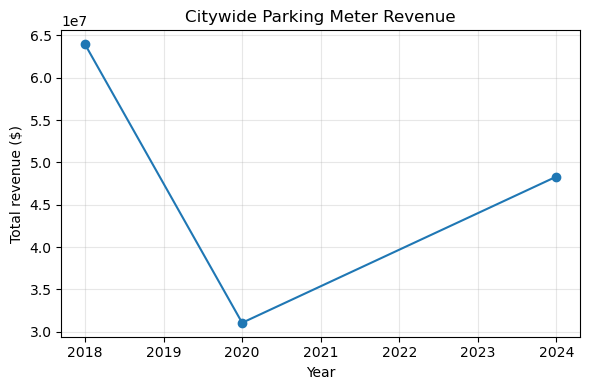

In [38]:
plt.figure(figsize=(6,4))
plt.plot([2018, 2020, 2024], city_totals.values, marker="o")
plt.title("Citywide Parking Meter Revenue")
plt.ylabel("Total revenue ($)")
plt.xlabel("Year")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Top neighborhoods (grouped bars)

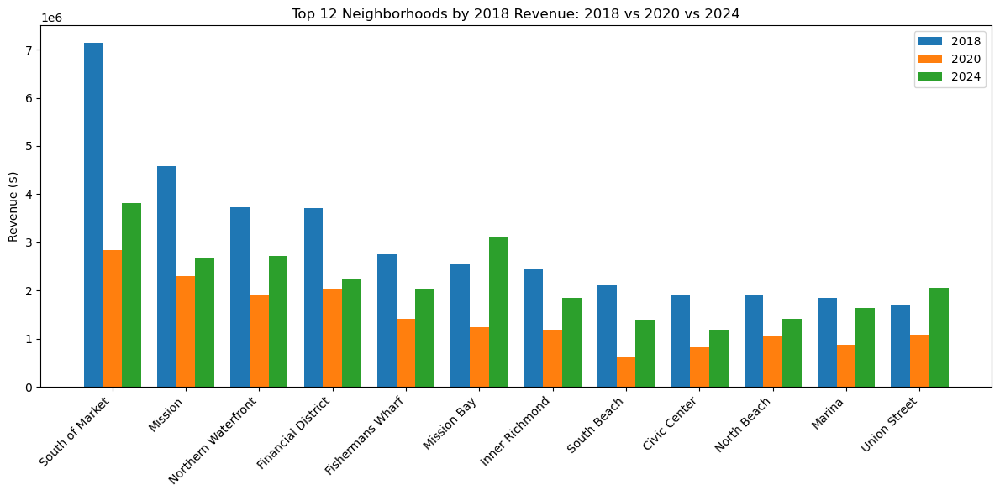

In [40]:
topN = 12
top_neigh = rev_all.sort_values("revenue_2018", ascending=False).head(topN).copy()

x = np.arange(topN)
w = 0.26

plt.figure(figsize=(12,6))
plt.bar(x - w, top_neigh["revenue_2018"].values, width=w, label="2018")
plt.bar(x,      top_neigh["revenue_2020"].values, width=w, label="2020")
plt.bar(x + w,  top_neigh["revenue_2024"].values, width=w, label="2024")

plt.xticks(x, top_neigh["neighborhood"].tolist(), rotation=45, ha="right")
plt.title(f"Top {topN} Neighborhoods by 2018 Revenue: 2018 vs 2020 vs 2024")
plt.ylabel("Revenue ($)")
plt.legend()
plt.tight_layout()
plt.show()

# Who recovered? (ratio bars)

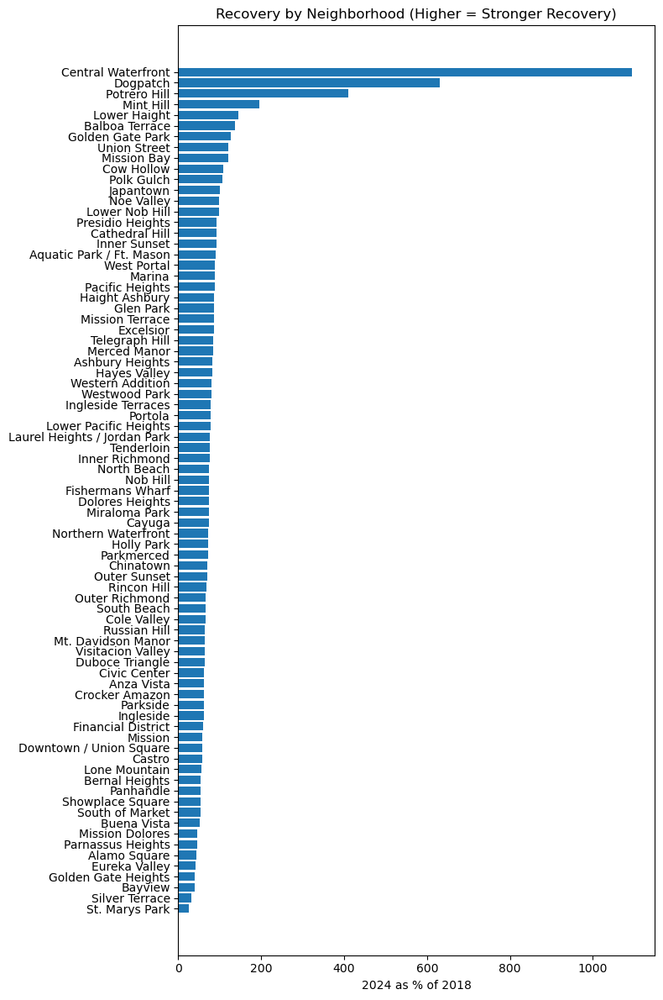

In [42]:
rank = rev_all.sort_values("ratio_24_18", ascending=False).copy()
rank["pct_of_2018"] = (rank["ratio_24_18"] * 100).round(1)

plt.figure(figsize=(8,12))
y = np.arange(len(rank))
plt.barh(y, rank["pct_of_2018"].values)
plt.yticks(y, rank["neighborhood"].tolist())
plt.xlabel("2024 as % of 2018")
plt.title("Recovery by Neighborhood (Higher = Stronger Recovery)")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

# Slopegraph for a selected list

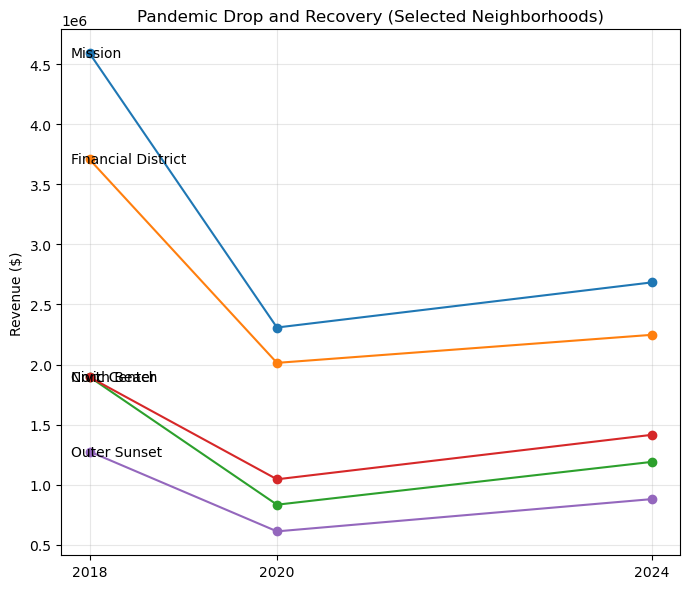

In [44]:
focus = ["Downtown", "Financial District", "Union Square", "SOMA", "Mission", "Civic Center", "North Beach", "Outer Sunset"]
subset = rev_all[rev_all["neighborhood"].isin(focus)].copy()

years = [2018, 2020, 2024]
plt.figure(figsize=(7,6))
for _, r in subset.iterrows():
    vals = [r["revenue_2018"], r["revenue_2020"], r["revenue_2024"]]
    plt.plot(years, vals, marker="o", linewidth=1.5)
    plt.text(2018 - 0.2, vals[0], r["neighborhood"], va="center")

plt.title("Pandemic Drop and Recovery (Selected Neighborhoods)")
plt.ylabel("Revenue ($)")
plt.xticks(years, years)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 3) 2024 relative to 2018 (ratio = 2024 / 2018)

In [62]:
import pandas as pd
import numpy as np
import folium
from folium import GeoJson, GeoJsonTooltip, LayerControl
import branca



def norm_key(s): return s.astype(str).str.strip().str.upper()

# Merge totals onto polygons once
g = neigh.copy()
g["key"] = norm_key(g["name"])

r18 = rev_by_neigh_2018.copy(); r18["key"] = norm_key(r18["neighborhood"])
r20 = rev_by_neigh_2020.copy(); r20["key"] = norm_key(r20["neighborhood"])
r24 = rev_by_neigh_2024.copy(); r24["key"] = norm_key(r24["neighborhood"])

g = (g.merge(r18[["key","revenue_2018"]], on="key", how="left")
       .merge(r20[["key","revenue_2020"]], on="key", how="left")
       .merge(r24[["key","revenue_2024"]], on="key", how="left")
       .fillna({"revenue_2018":0, "revenue_2020":0, "revenue_2024":0}))

# Compute ratios
g["ratio_20_18"] = (g["revenue_2020"] + 1) / (g["revenue_2018"] + 1)
g["ratio_24_18"] = (g["revenue_2024"] + 1) / (g["revenue_2018"] + 1)

# Make bins for ratios
def categorize_ratio(x):
    if x < 0.70: return "< 70% of 2018"
    if x < 0.90: return "70–90% of 2018"
    if x <= 1.10: return "90–110% (≈ baseline)"
    if x <= 1.30: return "110–130% of 2018"
    return "> 130% of 2018"

g["cat_20_18"] = g["ratio_20_18"].apply(categorize_ratio)
g["cat_24_18"] = g["ratio_24_18"].apply(categorize_ratio)

# Color maps
# Absolute 2018: quantile scale, warm colors
vals18 = g["revenue_2018"].values
qmin, q20, q40, q60, q80, qmax = np.nanpercentile(vals18, [0,20,40,60,80,100])
abs_cmap = branca.colormap.linear.YlOrRd_09.to_step(index=[qmin,q20,q40,q60,q80,qmax])

# Ratio maps: diverging palette around 1.0 with discrete steps
ratio_palette = {
    "< 70% of 2018": "#b2182b",   # deep red
    "70–90% of 2018": "#ef8a62",  # red-orange
    "90–110% (≈ baseline)": "#f7f7f7",  # neutral
    "110–130% of 2018": "#67a9cf",      # teal
    "> 130% of 2018": "#2166ac"         # deep blue
}

def ratio_color(cat): return ratio_palette.get(cat, "#cccccc")

# Build one map with three toggleable layers
sf_center = [37.7749, -122.4194]
m = folium.Map(location=sf_center, zoom_start=13, tiles="CartoDB positron")

# Layer A: 2018 absolute revenue (choropleth-ish via style_function)
layer_2018 = folium.FeatureGroup(name="2018: Absolute Revenue", show=True)
def style_abs_2018(feat):
    val = feat["properties"].get("revenue_2018", 0)
    return {
        "fillOpacity": 0.8,
        "weight": 0.5,
        "color": "#666666",
        "fillColor": abs_cmap(val) if np.isfinite(val) else "#ffffff"
    }

gj18 = GeoJson(
    g,
    name="2018",
    style_function=style_abs_2018,
    tooltip=GeoJsonTooltip(
        fields=["name", "revenue_2018"],
        aliases=["Neighborhood", "2018 Revenue ($)"],
        localize=True,
        sticky=False
    )
)
gj18.add_to(layer_2018)
layer_2018.add_to(m)

# Add colorbar for 2018
abs_cmap.caption = "2018 Revenue (quantiles)"
abs_cmap.add_to(m)

# Layer B: 2020 relative to 2018 (discrete classes)
layer_20 = folium.FeatureGroup(name="2020 vs 2018 (ratio)", show=False)
def style_ratio_20(feat):
    cat = feat["properties"].get("cat_20_18", None)
    return {
        "fillOpacity": 0.85,
        "weight": 0.5,
        "color": "#666666",
        "fillColor": ratio_color(cat)
    }

gj20 = GeoJson(
    g,
    name="2020/2018",
    style_function=style_ratio_20,
    tooltip=GeoJsonTooltip(
        fields=["name", "revenue_2018", "revenue_2020", "ratio_20_18", "cat_20_18"],
        aliases=["Neighborhood", "2018 ($)", "2020 ($)", "2020/2018", "Class"],
        localize=True,
        sticky=False
    )
)
gj20.add_to(layer_20)
layer_20.add_to(m)

# Layer C: 2024 relative to 2018 (discrete classes)
layer_24 = folium.FeatureGroup(name="2024 vs 2018 (ratio)", show=False)
def style_ratio_24(feat):
    cat = feat["properties"].get("cat_24_18", None)
    return {
        "fillOpacity": 0.85,
        "weight": 0.5,
        "color": "#666666",
        "fillColor": ratio_color(cat)
    }

gj24 = GeoJson(
    g,
    name="2024/2018",
    style_function=style_ratio_24,
    tooltip=GeoJsonTooltip(
        fields=["name", "revenue_2018", "revenue_2024", "ratio_24_18", "cat_24_18"],
        aliases=["Neighborhood", "2018 ($)", "2024 ($)", "2024/2018", "Class"],
        localize=True,
        sticky=False
    )
)
gj24.add_to(layer_24)
layer_24.add_to(m)

# Legend for ratio classes (simple HTML box)
legend_html = """
<div style="position: fixed; bottom: 18px; left: 18px; z-index: 9999; background: white; padding: 8px 10px; border:1px solid #bbb; font-size:12px;">
<b>Ratio legend</b><br>
<span style="background:#b2182b;display:inline-block;width:14px;height:10px;margin-right:6px;"></span> &lt; 70% of 2018<br>
<span style="background:#ef8a62;display:inline-block;width:14px;height:10px;margin-right:6px;"></span> 70–90% of 2018<br>
<span style="background:#f7f7f7;display:inline-block;width:14px;height:10px;margin-right:6px;border:1px solid #ddd;"></span> 90–110% (≈ baseline)<br>
<span style="background:#67a9cf;display:inline-block;width:14px;height:10px;margin-right:6px;"></span> 110–130% of 2018<br>
<span style="background:#2166ac;display:inline-block;width:14px;height:10px;margin-right:6px;"></span> &gt; 130% of 2018
</div>
"""
m.get_root().html.add_child(folium.Element(legend_html))

LayerControl(collapsed=False).add_to(m)
m  # displays inline

# MUNI Data

In [9]:
muni_routes = pd.read_csv('/Users/rohanbenjamin/Desktop/Python Project/Parking Meters/Muni_Simple_Routes_20250831.csv')
muni_boarded = pd.read_excel('/Users/rohanbenjamin/Desktop/Python Project/Parking Meters/muni avg daily boarding.xlsx')


In [15]:
muni_routes.dtypes

objectid            int64
PATTERN            object
PATTERNID           int64
ROUTE_NAME         object
DIRECTION          object
PATTERN_TYPE       object
SUB_TYPE            int64
PATTERN_VERSION     int64
LINEABBR           object
SIGNID              int64
SERVICE_CA         object
shape              object
data_as_of         object
data_loaded_at     object
dtype: object

In [17]:
muni_boarded.dtypes

Month                      datetime64[ns]
Route                              object
Service Category                   object
Service Day of the Week            object
Average Daily Boardings           float64
dtype: object

In [21]:
muni_boarded.head()

,Month,Route,Service Category,Service Day of the Week,Average Daily Boardings
0,2019-01-01,1 California,Frequent Local,Sunday,9600.0
1,2019-02-01,1 California,Frequent Local,Sunday,11500.0
2,2019-03-01,1 California,Frequent Local,Sunday,11800.0
3,2019-04-01,1 California,Frequent Local,Sunday,10800.0
4,2019-05-01,1 California,Frequent Local,Sunday,10800.0


## Prep neighborhood geometries

In [23]:
import geopandas as gpd
import pandas as pd
from shapely import wkt

# Load neighborhoods
neigh = pd.read_csv("/Users/rohanbenjamin/Desktop/Python Project/Parking Meters/SF_Find_Neighborhoods_20250830.csv")
neigh["geometry"] = neigh["the_geom"].apply(wkt.loads)
gdf_neigh = gpd.GeoDataFrame(neigh, geometry="geometry", crs="EPSG:4326")

## Prep MUNI routes

In [27]:
# Parse Muni route shapes
muni_routes["geometry"] = muni_routes["shape"].apply(wkt.loads)
gdf_routes = gpd.GeoDataFrame(muni_routes, geometry="geometry", crs="EPSG:4326")

# Standardize route codes for matching
muni_boarded["ROUTE_NAME"] = muni_boarded["Route"].str.split().str[0].str.upper()
gdf_routes["ROUTE_NAME"] = gdf_routes["ROUTE_NAME"].astype(str).str.strip().str.upper()

## Aggregate ridership

In [30]:
# 2018 baseline
base_2018 = (
    muni_boarded[muni_boarded["Month"].dt.year == 2019]
    .groupby("ROUTE_NAME", as_index=False)["Average Daily Boardings"].mean()
    .rename(columns={"Average Daily Boardings": "ridership_2018"})
)

# 2020
ridership_2020 = (
    muni_boarded[muni_boarded["Month"].dt.year == 2020]
    .groupby("ROUTE_NAME", as_index=False)["Average Daily Boardings"].mean()
    .rename(columns={"Average Daily Boardings": "ridership_2020"})
)

# 2024
ridership_2024 = (
    muni_boarded[muni_boarded["Month"].dt.year == 2024]
    .groupby("ROUTE_NAME", as_index=False)["Average Daily Boardings"].mean()
    .rename(columns={"Average Daily Boardings": "ridership_2024"})
)

##  Merge into one GeoDataFrame

In [34]:
gdf_routes_all = (
    gdf_routes
    .merge(base_2018, on="ROUTE_NAME", how="left")
    .merge(ridership_2020, on="ROUTE_NAME", how="left")
    .merge(ridership_2024, on="ROUTE_NAME", how="left")
)

# Compute ratios (with +1 to avoid div by zero)
gdf_routes_all["ratio_20_18"] = (gdf_routes_all["ridership_2020"] + 1) / (gdf_routes_all["ridership_2018"] + 1)
gdf_routes_all["ratio_24_18"] = (gdf_routes_all["ridership_2024"] + 1) / (gdf_routes_all["ridership_2018"] + 1)

## Plot map

In [46]:
# Convert ridership + ratios to numeric floats
for col in ["ridership_2018", "ridership_2020", "ridership_2024", "ratio_20_18", "ratio_24_18"]:
    if col in gdf_routes_all.columns:
        gdf_routes_all[col] = pd.to_numeric(gdf_routes_all[col], errors="coerce").astype(float)

In [51]:
import numpy as np
import pandas as pd
import folium
from folium import GeoJson, GeoJsonTooltip, FeatureGroup, LayerControl
import branca


required_cols = ["ridership_2018", "ridership_2020", "ridership_2024"]
for c in required_cols:
    if c not in gdf_routes_all.columns:
        gdf_routes_all[c] = np.nan

# Coerce to numeric floats
for c in ["ridership_2018", "ridership_2020", "ridership_2024"]:
    gdf_routes_all[c] = pd.to_numeric(gdf_routes_all[c], errors="coerce")

# Safe ratios: (year+1) / (2018+1)
gdf_routes_all["ratio_20_18"] = (gdf_routes_all["ridership_2020"].fillna(0) + 1.0) / (gdf_routes_all["ridership_2018"].fillna(0) + 1.0)
gdf_routes_all["ratio_24_18"] = (gdf_routes_all["ridership_2024"].fillna(0) + 1.0) / (gdf_routes_all["ridership_2018"].fillna(0) + 1.0)

# Drop routes that have no geometry or are completely empty
gdf_routes_all = gdf_routes_all[~gdf_routes_all.geometry.isna()].copy()

# Convenience: replace inf/-inf
for c in ["ridership_2018","ridership_2020","ridership_2024","ratio_20_18","ratio_24_18"]:
    gdf_routes_all.loc[~np.isfinite(gdf_routes_all[c]), c] = np.nan


# Color Scales
# Absolute colorbar (quantiles on valid 2018 numbers)
vals18 = gdf_routes_all["ridership_2018"].dropna().to_numpy(dtype=float)
if vals18.size == 0:
    qs18 = [0, 1, 2, 3, 4, 5]
else:
    qs18 = list(np.nanpercentile(vals18, [0, 20, 40, 60, 80, 100]))

cmap18 = branca.colormap.linear.YlOrRd_09.to_step(index=qs18)
cmap18.caption = "2018 (labeled) Ridership — quantiles"

def ratio_color(val: float) -> str:
    # Diverging palette around 1.0
    if val is None or not np.isfinite(val):
        return "#cccccc"
    if val < 0.70:  return "#b2182b"
    if val < 0.90:  return "#ef8a62"
    if val <= 1.10: return "#f7f7f7"
    if val <= 1.30: return "#67a9cf"
    return "#2166ac"

# Map Layers

sf_center = [37.7749, -122.4194]
m = folium.Map(location=sf_center, zoom_start=12, tiles="CartoDB positron")

# Neighborhood grid (always on)
neigh_layer = FeatureGroup(name="Neighborhoods", show=True)
GeoJson(
    gdf_neigh,
    name="Neighborhoods",
    style_function=lambda f: {"fillOpacity": 0, "color": "#aaaaaa", "weight": 1},
    tooltip=GeoJsonTooltip(fields=["name"], aliases=["Neighborhood"])
).add_to(neigh_layer)
neigh_layer.add_to(m)

def add_route_layer(gdf, field, title, is_ratio=False, show=False):
    layer = FeatureGroup(name=title, show=show)

    def style_fun(feat):
        # Pull values defensively and cast to float
        props = feat["properties"]
        v_raw = props.get(field, np.nan)
        b_raw = props.get("ridership_2018", np.nan)
        try:
            v = float(v_raw) if v_raw is not None else np.nan
        except Exception:
            v = np.nan
        try:
            base = float(b_raw) if b_raw is not None else np.nan
        except Exception:
            base = np.nan

        # line thickness by baseline riders (bounded)
        if np.isfinite(base):
            weight = 2 + min(6.0, base / 5000.0)
        else:
            weight = 2.0

        if is_ratio:
            color = ratio_color(v)
        else:
            # For absolute: map value through quantile colorbar; fall back to light fill
            color = cmap18(v) if (v is not None and np.isfinite(v)) else "#eeeeee"

        return {"color": color, "weight": weight, "opacity": 0.95}

    GeoJson(
        gdf,
        style_function=style_fun,
        tooltip=GeoJsonTooltip(
            fields=["ROUTE_NAME", "ridership_2018", "ridership_2020", "ridership_2024",
                    "ratio_20_18", "ratio_24_18"],
            aliases=["Route", "2018 riders", "2020 riders", "2024 riders", "2020/2018", "2024/2018"],
            localize=True
        )
    ).add_to(layer)

    layer.add_to(m)
    return layer

# Add layers
layer_abs  = add_route_layer(gdf_routes_all, "ridership_2018", "Routes — 2018 baseline (Jan 2019)", is_ratio=False, show=True)
layer_r20  = add_route_layer(gdf_routes_all, "ratio_20_18", "Routes — 2020 / 2018", is_ratio=True, show=False)
layer_r24  = add_route_layer(gdf_routes_all, "ratio_24_18", "Routes — 2024 / 2018", is_ratio=True, show=False)

# Add colorbar (for absolute layer)
cmap18.add_to(m)

# Legends (HTML) and auto-switching
legend_abs = """
<div id="legend_abs" style="position: fixed; bottom: 22px; left: 18px; z-index: 9999;
 background: white; padding: 10px 12px; border:1px solid #bbb; font-size:12px;">
<b>2018 Ridership (quantiles)</b><br>
<span style="display:inline-block;width:14px;height:10px;background:#ffffb2;margin-right:6px;"></span> low
<span style="display:inline-block;width:14px;height:10px;background:#fecc5c;margin:0 6px;"></span> …
<span style="display:inline-block;width:14px;height:10px;background:#bd0026;margin-right:6px;"></span> high<br>
<em>Line thickness ∝ 2018 riders</em>
</div>
"""

legend_ratio = """
<div id="legend_ratio" style="position: fixed; bottom: 22px; left: 18px; z-index: 9999;
 background: white; padding: 10px 12px; border:1px solid #bbb; font-size:12px; display:none;">
<b>Ridership Ratio vs 2018</b><br>
<span style="display:inline-block;width:14px;height:10px;background:#b2182b;margin-right:6px;"></span> &lt; 70%<br>
<span style="display:inline-block;width:14px;height:10px;background:#ef8a62;margin-right:6px;"></span> 70–90%<br>
<span style="display:inline-block;width:14px;height:10px;background:#f7f7f7;border:1px solid #ddd;margin-right:6px;"></span> 90–110%<br>
<span style="display:inline-block;width:14px;height:10px;background:#67a9cf;margin-right:6px;"></span> 110–130%<br>
<span style="display:inline-block;width:14px;height:10px;background:#2166ac;margin-right:6px;"></span> &gt; 130%<br>
<em>Line thickness ∝ 2018 riders</em>
</div>
"""
m.get_root().html.add_child(folium.Element(legend_abs))
m.get_root().html.add_child(folium.Element(legend_ratio))

LayerControl(collapsed=False).add_to(m)

switch_js = """
<script>
function setLegend(which){
  var abs = document.getElementById('legend_abs');
  var rat = document.getElementById('legend_ratio');
  if(!abs || !rat) return;
  if(which === 'abs'){ abs.style.display = 'block'; rat.style.display = 'none'; }
  if(which === 'ratio'){ abs.style.display = 'none'; rat.style.display = 'block'; }
}
setLegend('abs');
var map = window._leaflet_map || window.map;
map.on('overlayadd', function(e){
  if(e.name && e.name.indexOf('2018 baseline') >= 0){ setLegend('abs'); }
  if(e.name && (e.name.indexOf('2020 / 2018') >= 0 || e.name.indexOf('2024 / 2018') >= 0)){ setLegend('ratio'); }
});
map.on('overlayremove', function(e){
  setTimeout(function(){
    var has2018=false, hasRatio=false;
    map.eachLayer(function(layer){
      if(layer.options && layer.options.name){
        var n = layer.options.name;
        if(n && n.indexOf('2018 baseline')>=0) has2018=true;
        if(n && (n.indexOf('2020 / 2018')>=0 || n.indexOf('2024 / 2018')>=0)) hasRatio=true;
      }
    });
    setLegend(hasRatio ? 'ratio' : 'abs');
  }, 200);
});
</script>
"""
m.get_root().html.add_child(folium.Element(switch_js))

m  # <= render in notebook

In [57]:
# Aggregate ridership across all shapes for each route
summary_table_unique = (
    summary_table
    .groupby("ROUTE_NAME", as_index=False)
    .agg({
        "ridership_2018": "mean",   # or "sum" if you want total riders
        "ridership_2020": "mean",
        "ridership_2024": "mean"
    })
)

# Recompute ratios after aggregation
summary_table_unique["2020_vs_2018"] = (
    (summary_table_unique["ridership_2020"] + 1) /
    (summary_table_unique["ridership_2018"] + 1)
)
summary_table_unique["2024_vs_2018"] = (
    (summary_table_unique["ridership_2024"] + 1) /
    (summary_table_unique["ridership_2018"] + 1)
)

# Round for readability
summary_table_unique = summary_table_unique.round({
    "ridership_2018": 0,
    "ridership_2020": 0,
    "ridership_2024": 0,
    "2020_vs_2018": 2,
    "2024_vs_2018": 2
})

# Sort by baseline riders
summary_table_unique = summary_table_unique.sort_values(
    "ridership_2018", ascending=False
).reset_index(drop=True)

summary_table_unique

,ROUTE_NAME,ridership_2018,ridership_2020,ridership_2024,2020_vs_2018,2024_vs_2018
0,N,30678.0,31256.0,22067.0,1.02,0.72
1,14,23914.0,14761.0,22858.0,0.62,0.96
2,KT,23306.0,21611.0,NaN,0.93,NaN
3,8,23258.0,12906.0,18883.0,0.55,0.81
4,L,21692.0,21578.0,8083.0,0.99,0.37
...,...,...,...,...,...,...
63,NBUS,NaN,NaN,NaN,NaN,NaN
64,PH,NaN,NaN,NaN,NaN,NaN
65,PM,NaN,NaN,NaN,NaN,NaN
66,T,NaN,NaN,14856.0,NaN,NaN


# BART 

In [65]:
bart_exits = pd.read_excel('/Users/rohanbenjamin/Desktop/Python Project/Parking Meters/Daily_Station_Exits.xlsx')

In [69]:
station_codes = pd.read_excel('/Users/rohanbenjamin/Desktop/Python Project/Parking Meters/Bart station codes.xlsx')

In [73]:
station_codes.head()

,Station,Station Code,In SF?,Coordinates
0,Richmond,RM,0,NaN
1,El Cerrito Del Norte,EN,0,NaN
2,El Cerrito Plaza,EP,0,NaN
3,North Berkeley,NB,0,NaN
4,Berkeley,BK,0,NaN


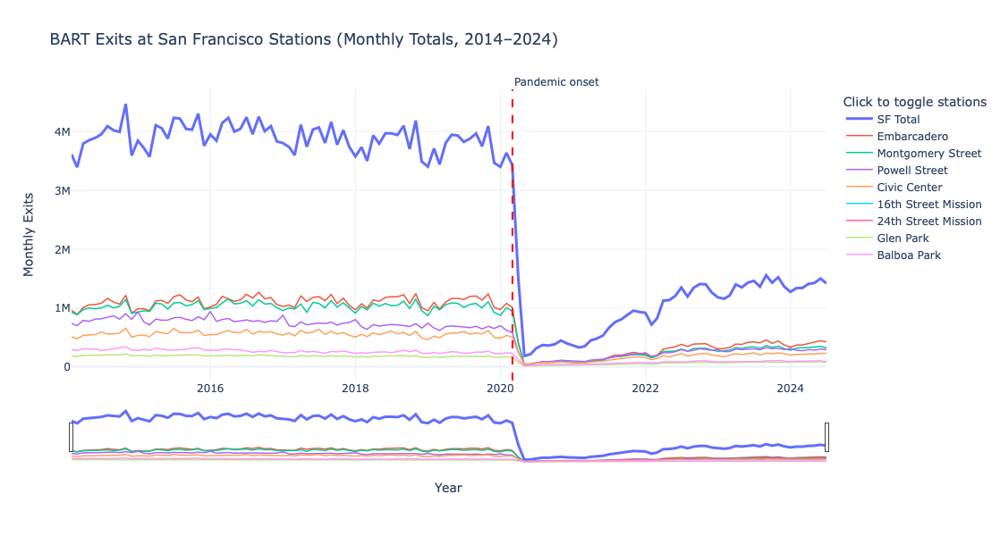

In [81]:
import pandas as pd
import plotly.graph_objects as go

# Paths
p_exits = "/Users/rohanbenjamin/Desktop/Python Project/Parking Meters/Daily_Station_Exits.xlsx"
p_codes = "/Users/rohanbenjamin/Desktop/Python Project/Parking Meters/Bart station codes.xlsx"

# Load 
bart_exits = pd.read_excel(p_exits)
station_codes = pd.read_excel(p_codes)

# Identify SF stations 
sf_codes = (
    station_codes.loc[station_codes["In SF?"] == 1, "Station Code"]
    .astype(str).str.strip().tolist()
)
sf_names = (
    station_codes.assign(**{"Station Code": station_codes["Station Code"].astype(str).str.strip()})
    .set_index("Station Code").loc[sf_codes, "Station"].to_dict()
)

# Coerce types & filter date range 
bart_exits["Date"] = pd.to_datetime(bart_exits["Date"], errors="coerce")

# Ensure all SF station columns exist and are numeric
for code in sf_codes:
    if code not in bart_exits.columns:
        bart_exits[code] = pd.NA
    bart_exits[code] = pd.to_numeric(bart_exits[code], errors="coerce")

# Keep 2014–2024
mask = (bart_exits["Date"].dt.year >= 2014) & (bart_exits["Date"].dt.year <= 2024)
bart_exits = bart_exits.loc[mask].copy()

# Monthly totals per station
monthly = (
    bart_exits.set_index("Date")[sf_codes]
    .resample("M").sum(min_count=1)  # monthly totals
)

# Citywide total
monthly["SF Total"] = monthly.sum(axis=1, min_count=1)

# Plotly interactive figure 
fig = go.Figure()

# Add citywide total first (thicker line)
fig.add_trace(
    go.Scatter(
        x=monthly.index, y=monthly["SF Total"],
        mode="lines", name="SF Total", line=dict(width=3)
    )
)

# Add each SF station (click legend to toggle)
for code in sf_codes:
    fig.add_trace(
        go.Scatter(
            x=monthly.index,
            y=monthly[code],
            mode="lines",
            name=sf_names.get(code, code),
            line=dict(width=1.5)
        )
    )

# Pandemic marker
pandemic_start = pd.to_datetime("2020-03-01")
fig.add_vline(x=pandemic_start, line_dash="dash", line_color="red")
fig.add_annotation(
    x=pandemic_start, y=1, xref="x", yref="paper",
    xanchor="left", yanchor="bottom",
    text="Pandemic onset", showarrow=False
)

# Layout polish 
fig.update_layout(
    title="BART Exits at San Francisco Stations (Monthly Totals, 2014–2024)",
    xaxis_title="Year",
    yaxis_title="Monthly Exits",
    template="plotly_white",
    legend_title="Click to toggle stations",
    hovermode="x unified",
    width=1000, height=600
)

# rangeslider
fig.update_xaxes(rangeslider_visible=True)

fig.show()